In [22]:
%load_ext autoreload
%autoreload 2

import os

import numpy as np
import tempfile
from astropy.io import fits
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Times New Roman"],  # You can change this font if you prefer
    "axes.labelsize": 14,  # Adjust as needed
    "axes.titlesize": 16,  # Adjust as needed
    "xtick.labelsize": 14,  # Adjust as needed
    "ytick.labelsize": 14,  # Adjust as needed
    "legend.fontsize": 12,  # Adjust as needed
    "figure.figsize": (15, 8),  # Adjust as needed
    "figure.dpi": 600  # Adjust as needed
})
from shear_psf_leakage.rho_tau_stat import RhoStat, TauStat, PSFErrorFit

import treecorr

from getdist import plots, MCSamples

%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
version = 'SP_v1.3_LFmask_8k'
base_dir = './data/'
cov_tau_sim = np.load(base_dir+'/cov_tau_'+version+'_sim.npy')
cov_tau_jk = np.load(base_dir+'/cov_tau_'+version+'.npy')
cov_tau_th = np.load(base_dir+'/cov_tau_'+version+'_th.npy')
#cov_tau_th_test = np.load(base_dir+'/cov_tau_SP_v1.4-P3_th_test.npy')

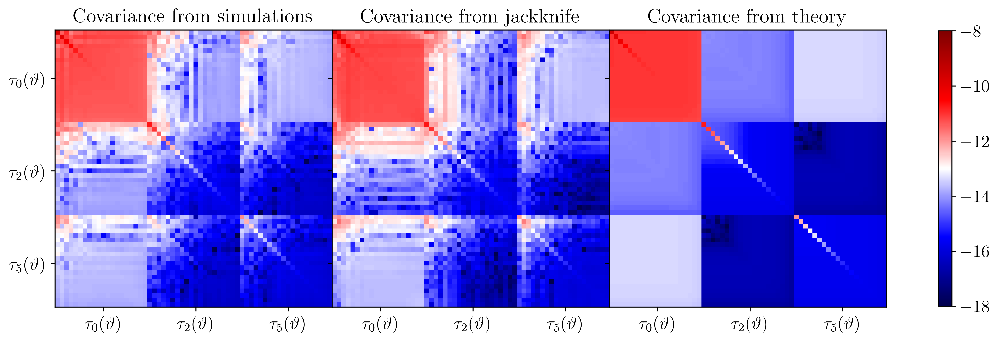

In [5]:


fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# First subplot
im1 = axs[0].imshow(np.log10(np.abs(cov_tau_sim)), cmap='seismic', vmin=-18, vmax=-8)
axs[0].set_title('Covariance from simulations')
axs[0].set_aspect('equal')  # Set equal aspect ratio
axs[0].set_yticks(np.array([10, 30, 50]))
axs[0].set_yticklabels([r"$\tau_0(\vartheta)$", r"$\tau_2(\vartheta)$", r"$\tau_5(\vartheta)$"])
axs[0].set_xticks(np.array([10, 30, 50]))
axs[0].set_xticklabels([r"$\tau_0(\vartheta)$", r"$\tau_2(\vartheta)$", r"$\tau_5(\vartheta)$"])

# Second subplot

im2 = axs[1].imshow(np.log10(np.abs(cov_tau_jk)), cmap='seismic', vmin=-18, vmax=-8)
axs[1].set_title("Covariance from jackknife")
axs[1].set_aspect('equal')  # Set equal aspect ratio
axs[1].set_xticks(np.array([10, 30, 50]))
axs[1].set_xticklabels([r"$\tau_0(\vartheta)$", r"$\tau_2(\vartheta)$", r"$\tau_5(\vartheta)$"])

# Third subplot

im3 = axs[2].imshow(np.log10(np.abs(cov_tau_th)), cmap='seismic', vmin=-18, vmax=-8)
axs[2].set_title("Covariance from theory")
axs[2].set_aspect('equal')  # Set equal aspect ratio
axs[2].set_xticks(np.array([10, 30, 50]))
axs[2].set_xticklabels([r"$\tau_0(\vartheta)$", r"$\tau_2(\vartheta)$", r"$\tau_5(\vartheta)$"])

plt.subplots_adjust(wspace=0.)
fig.colorbar(im2, ax = axs, orientation="vertical", shrink=0.8)

plt.show()

In [6]:
#Correlation matrix

corr_tau_sim = np.array(
    [[1/(cov_tau_sim[i,i]*cov_tau_sim[j,j]) for i in range(60)] for j in range(60)]
)

corr_tau_jk = np.array(
    [[1/(cov_tau_jk[i,i]*cov_tau_jk[j,j]) for i in range(60)] for j in range(60)]
)

corr_tau_th = np.array(
    [[1/(cov_tau_th[i,i]*cov_tau_th[j,j]) for i in range(60)] for j in range(60)]
)

corr_tau_sim = cov_tau_sim*np.sqrt(corr_tau_sim)
corr_tau_jk = cov_tau_jk*np.sqrt(corr_tau_jk)
corr_tau_th = cov_tau_th*np.sqrt(corr_tau_th)

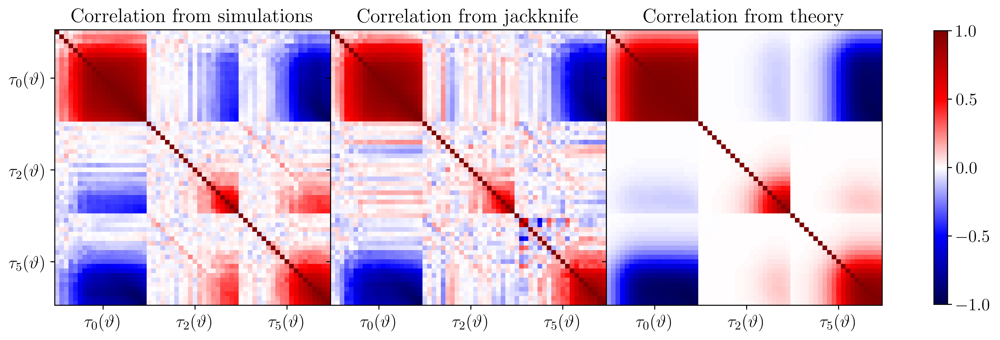

In [7]:

fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# First subplot
im1 = axs[0].imshow(corr_tau_sim, cmap='seismic', vmin=-1, vmax=1)
axs[0].set_title('Correlation from simulations')
axs[0].set_aspect('equal')  # Set equal aspect ratio
axs[0].set_yticks(np.array([10, 30, 50]))
axs[0].set_yticklabels([r"$\tau_0(\vartheta)$", r"$\tau_2(\vartheta)$", r"$\tau_5(\vartheta)$"])
axs[0].set_xticks(np.array([10, 30, 50]))
axs[0].set_xticklabels([r"$\tau_0(\vartheta)$", r"$\tau_2(\vartheta)$", r"$\tau_5(\vartheta)$"])

# Second subplot

im2 = axs[1].imshow(corr_tau_jk, cmap='seismic', vmin=-1, vmax=1)
axs[1].set_title("Correlation from jackknife")
axs[1].set_aspect('equal')  # Set equal aspect ratio
axs[1].set_xticks(np.array([10, 30, 50]))
axs[1].set_xticklabels([r"$\tau_0(\vartheta)$", r"$\tau_2(\vartheta)$", r"$\tau_5(\vartheta)$"])

# Third subplot

im3 = axs[2].imshow(corr_tau_th, cmap='seismic', vmin=-1, vmax=1)
axs[2].set_title("Correlation from theory")
axs[2].set_aspect('equal')  # Set equal aspect ratio
axs[2].set_xticks(np.array([10, 30, 50]))
axs[2].set_xticklabels([r"$\tau_0(\vartheta)$", r"$\tau_2(\vartheta)$", r"$\tau_5(\vartheta)$"])

plt.subplots_adjust(wspace=0.)
fig.colorbar(im2, ax = axs, orientation="vertical", shrink=0.8)

#plt.tight_layout()

plt.show()

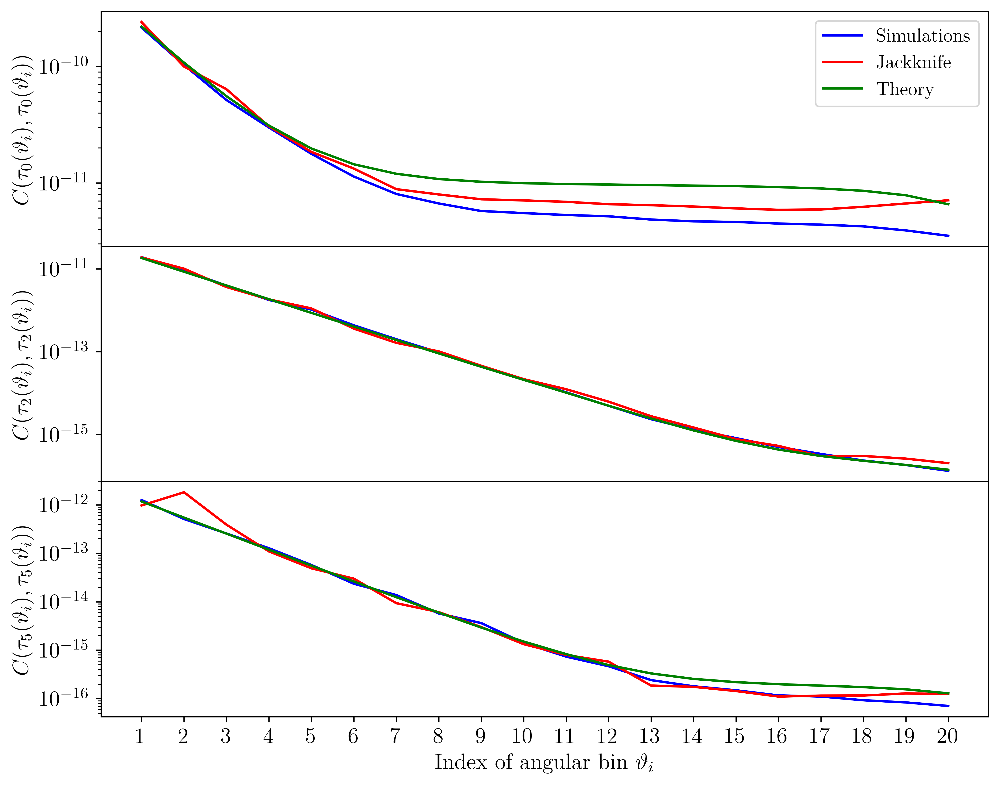

In [8]:
#Plot the diagonal of each covariance matrix

plt.figure(figsize=(10, 8))


plt.subplot(311)
plt.plot(np.diag(cov_tau_sim)[0:20], label='Simulations', color='blue')
plt.plot(np.diag(cov_tau_jk)[0:20], label='Jackknife', color='red')
plt.plot(np.diag(cov_tau_th)[0:20], label='Theory', color='green')
plt.ylabel(r"$C(\tau_0(\vartheta_i), \tau_0(\vartheta_i))$")
plt.legend()
plt.yscale('log')
plt.setp(plt.gca().get_xticklabels(), visible=False)

plt.subplot(312, sharex=plt.gca())
plt.plot(np.diag(cov_tau_sim)[20:40], label='Simulations', color='blue')
plt.plot(np.diag(cov_tau_jk)[20:40], label='Jackknife', color='red')
plt.plot(np.diag(cov_tau_th)[20:40], label='Theory', color='green')
plt.yscale('log')
plt.ylabel(r"$C(\tau_2(\vartheta_i), \tau_2(\vartheta_i))$")
plt.setp(plt.gca().get_xticklabels(), visible=False)

plt.subplot(313, sharex=plt.gca())
plt.plot(np.diag(cov_tau_sim)[40:60], label='Simulations', color='blue')
plt.plot(np.diag(cov_tau_jk)[40:60], label='Jackknife', color='red')
plt.plot(np.diag(cov_tau_th)[40:60], label='Theory', color='green')
plt.yscale('log')
plt.ylabel(r"$C(\tau_5(\vartheta_i), \tau_5(\vartheta_i))$")

plt.xlabel(r"Index of angular bin $\vartheta_i$")
plt.xticks(np.arange(0, 20), np.arange(1, 21))
plt.subplots_adjust(hspace=0)


plt.show()

In [9]:
#Inference of the xi_sys parameters
sep_units = 'arcmin'
coord_units = 'degrees'
theta_min = 0.1
theta_max = 250
nbins = 20


TreeCorrConfig_xi = {
    'ra_units': coord_units,
    'dec_units': coord_units,
    'min_sep': theta_min,
    'max_sep': theta_max,
    'sep_units': sep_units,
    'nbins': nbins,
    'var_method':'jackknife',
}

rho_stats_handler = RhoStat(
    output='.',
    treecorr_config=TreeCorrConfig_xi,
    verbose=True
)

tau_stats_handler = TauStat(
    catalogs=rho_stats_handler.catalogs,
    output='.',
    treecorr_config=TreeCorrConfig_xi,
    verbose=True
    )

Class created. Don't forget to load your rho and tau statistics and define your prior and your likelihood.
Simulation params: [ 0.0143862   1.13875631 -0.7415507 ]
Jackknife params: [ 0.0117248   1.05770116 -1.37125952]
Theory params: [ 0.01681895  0.99760472 -0.05221366]


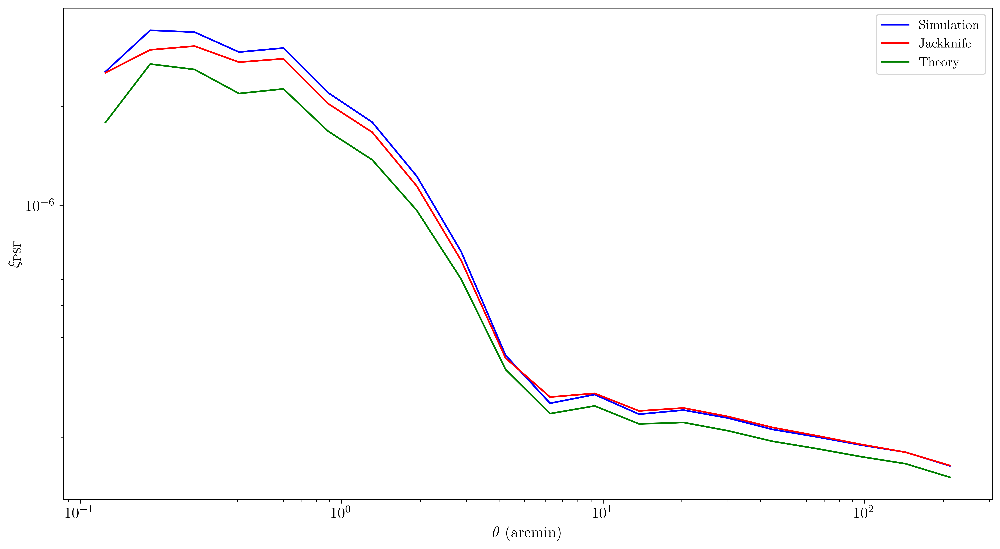

In [10]:
path_rho = 'rho_stats_'+version+'.fits'
path_tau = 'tau_stats_'+version+'.fits'
path_cov_tau_sim = 'cov_tau_'+version+'_sim.npy'
path_cov_tau_jk = 'cov_tau_'+version+'.npy'
path_cov_tau_th = 'cov_tau_'+version+'_th.npy'
path_cov_rho = 'cov_rho_'+version+'.npy'

psf_fitter = PSFErrorFit(rho_stats_handler, tau_stats_handler, base_dir)

psf_fitter.load_rho_stat(path_rho)
psf_fitter.load_tau_stat(path_tau)

psf_fitter.load_covariance(path_cov_tau_sim, cov_type='tau')
psf_fitter.load_covariance(path_cov_rho, cov_type='rho')

plt.figure()

params = psf_fitter.get_least_squares_params(npatch=300, apply_debias=True)
print("Simulation params:", params)
xi_sys = psf_fitter.compute_xi_psf_sys(params)
plt.plot(psf_fitter.rho_stat_handler.rho_stats['theta'], xi_sys, c='b', label='Simulation')

psf_fitter.load_covariance(path_cov_tau_jk, cov_type='tau')

params = psf_fitter.get_least_squares_params(npatch=100*150, apply_debias=True)
xi_sys = psf_fitter.compute_xi_psf_sys(params)
print("Jackknife params:", params)
plt.plot(psf_fitter.rho_stat_handler.rho_stats['theta'], xi_sys, c='r', label='Jackknife')

psf_fitter.load_covariance(path_cov_tau_th, cov_type='tau')

params = psf_fitter.get_least_squares_params(npatch=80, apply_debias=False)
xi_sys = psf_fitter.compute_xi_psf_sys(params)
print("Theory params:", params)
plt.plot(psf_fitter.rho_stat_handler.rho_stats['theta'], xi_sys, c='g', label='Theory')

plt.legend()
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\theta$ (arcmin)')
plt.ylabel(r'$\xi_{\rm PSF}$')

plt.show()


In [12]:
test_sim=False
test_jk=False
test_th=False
#Let's do the inference to have error bars
if os.path.exists(base_dir+'/samples_sim_lq_'+version+'.npy') and not test_sim:
    samples_sim_lq = np.load(base_dir+'/samples_sim_lq_'+version+'.npy')
    psf_fitter.load_covariance(path_cov_tau_sim, cov_type='tau')
    print('Chi2 Simulation:', psf_fitter.eval_chi_square(np.percentile(samples_sim_lq, 50, axis=0), npatch=300, apply_debias=True))
else:
    psf_fitter.load_covariance(path_cov_tau_sim, cov_type='tau')
    samples_sim_lq, _,_ = psf_fitter.get_least_squares_params_samples(npatch=300, apply_debias=True)

if os.path.exists(base_dir+'/samples_jk_lq_'+version+'.npy') and not test_jk:
    samples_jk_lq = np.load(base_dir+'/samples_jk_lq_'+version+'.npy')
    psf_fitter.load_covariance(path_cov_tau_jk, cov_type='tau')
    print('Chi2 Jackknife:', psf_fitter.eval_chi_square(np.percentile(samples_jk_lq, 50, axis=0), npatch=150, apply_debias=True))
else:
    psf_fitter.load_covariance(path_cov_tau_jk, cov_type='tau')
    samples_jk_lq, _,_ = psf_fitter.get_least_squares_params_samples(npatch=100*150, apply_debias=True)

if os.path.exists(base_dir+'/samples_th_lq_'+version+'.npy') and not test_th:
    samples_th_lq = np.load(base_dir+'/samples_th_lq_'+version+'.npy')
    psf_fitter.load_covariance(path_cov_tau_th, cov_type='tau')
    print('Chi2 Theory:', psf_fitter.eval_chi_square(np.percentile(samples_th_lq, 50, axis=0), npatch=300, apply_debias=False))
else:
    psf_fitter.load_covariance(path_cov_tau_th, cov_type='tau')
    samples_th_lq, _,_ = psf_fitter.get_least_squares_params_samples(npatch=80, apply_debias=False)

Chi2 Simulation: 67.83461367392903
Chi2 Jackknife: 49.09188002503218
Chi2 Theory: 102.20922034335263


In [13]:
np.save(base_dir+'/samples_sim_lq_'+version+'.npy', samples_sim_lq)
np.save(base_dir+'/samples_jk_lq_'+version+'.npy', samples_jk_lq)
np.save(base_dir+'/samples_th_lq_'+version+'.npy', samples_th_lq)

Removed no burn in
Removed no burn in
Removed no burn in


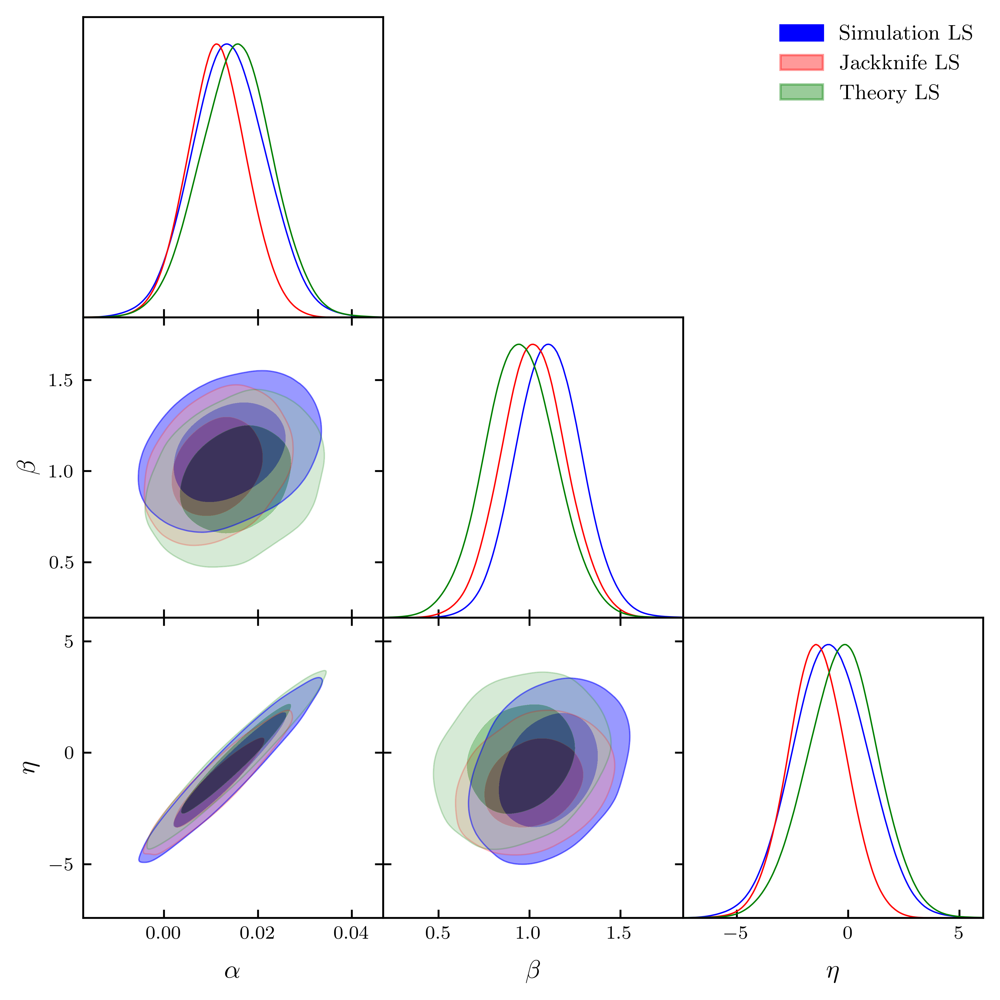

In [15]:
g = plots.get_subplot_plotter()

g.settings.figure_legend_frame = False
g.settings.alpha_filled_add=0.4

samples_sim_gd = MCSamples(samples=samples_sim_lq, names=[r"\alpha", r"\beta", r"\eta"], labels=[r"\alpha", r"\beta", r"\eta"])
samples_jk_gd = MCSamples(samples=samples_jk_lq, names=[r"\alpha", r"\beta", r"\eta"], labels=[r"\alpha", r"\beta", r"\eta"])
samples_th_gd = MCSamples(samples=samples_th_lq, names=[r"\alpha", r"\beta", r"\eta"], labels=[r"\alpha", r"\beta", r"\eta"])

g.triangle_plot([samples_sim_gd, samples_jk_gd, samples_th_gd],
                filled=True,
                legend_labels=[r'Simulation LS', r'Jackknife LS', r'Theory LS'],
                legend_loc='upper right',
                line_args=[
                    {'color': 'b'},
                    {'color': 'r'},
                    {'color': 'g'}
                ],
                contour_colors=['b', 'r', 'g'])

plt.show()

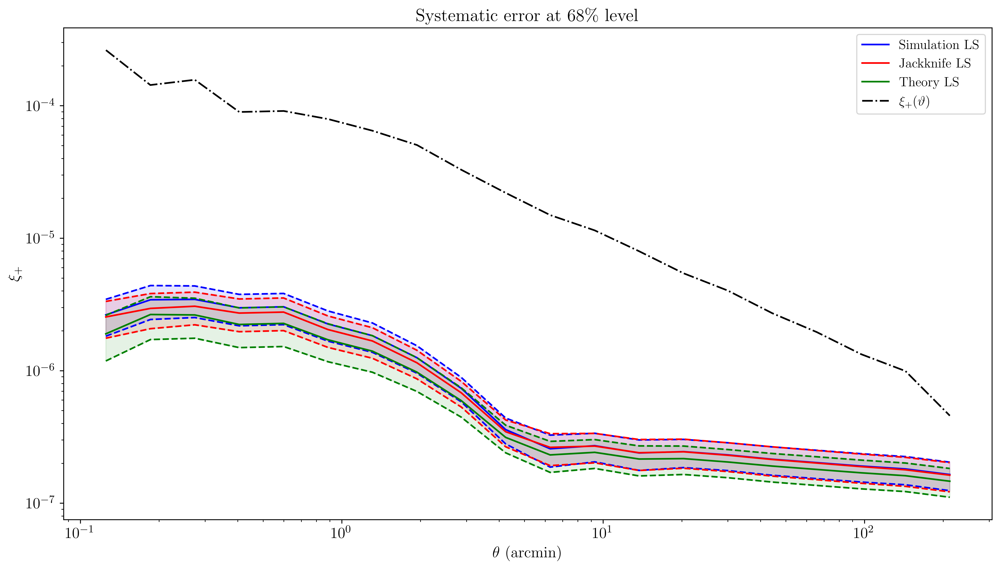

In [16]:
#plot of the xi_sys
plt.figure()

samples = [samples_sim_lq, samples_jk_lq, samples_th_lq]
colors = ['b', 'r', 'g']
labels = ['Simulation LS', 'Jackknife LS', 'Theory LS']

for sample, color, label in zip(samples, colors, labels):
    quant = 0.84
    quantiles = [1-quant, quant]
    nbins = psf_fitter.rho_stat_handler._treecorr_config['nbins']
    xi_psf_sys_samples = np.array([]).reshape(0, nbins)
    for i in range(len(sample)):
        xi_psf_sys = psf_fitter.compute_xi_psf_sys(sample[i])
        xi_psf_sys_samples = np.vstack((xi_psf_sys_samples, xi_psf_sys))
    
    xi_psf_sys_mean = np.mean(xi_psf_sys_samples, axis=0)
    xi_psf_sys_quant = np.quantile(xi_psf_sys_samples, quantiles, axis=0)
    theta = psf_fitter.rho_stat_handler.rho_stats['theta']
    plt.plot(theta, xi_psf_sys_mean, c=color, label=label)
    plt.plot(theta, xi_psf_sys_quant[0], c=color, ls='--')
    plt.plot(theta, xi_psf_sys_quant[1], c=color, ls='--')
    plt.fill_between(theta, xi_psf_sys_quant[0], xi_psf_sys_quant[1], color=color, alpha=0.1)

if os.path.exists(base_dir+'/xi_plus_'+version+'.fits'):
    xi_plus = fits.getdata(base_dir+'/xi_plus_'+version+'.fits')
    plt.plot(xi_plus['ANG'], xi_plus['VALUE'], c='k', ls='-.', label=r"$\xi_+(\vartheta)$")
else:
    raise ValueError("xi_plus file not found")

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\theta$ (arcmin)')
plt.ylabel(r'$\xi_{+}$')
plt.legend()
plt.title("Systematic error at 68\% level")
plt.show()

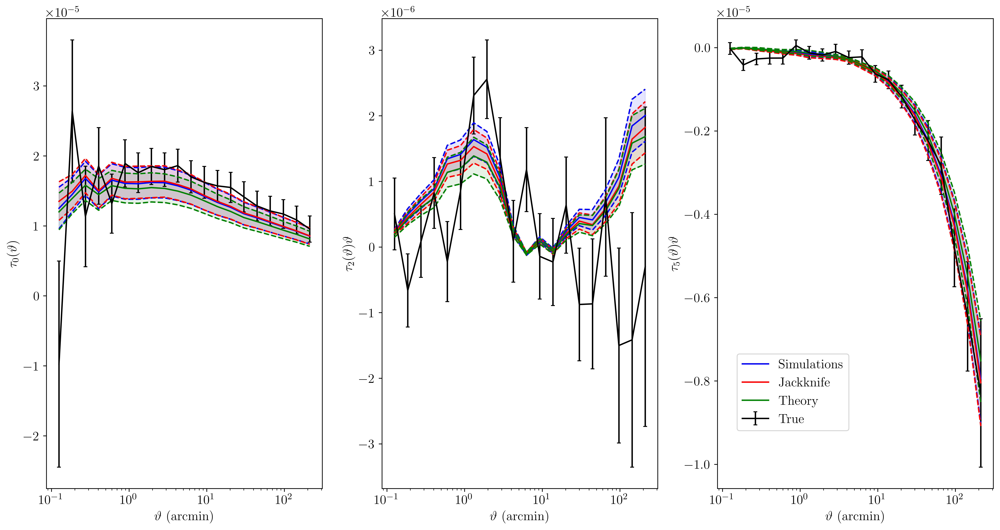

In [17]:
#To be done correctly for the paper
samples = [samples_sim_lq, samples_jk_lq, samples_th_lq]
colors = ['b', 'r', 'g']
labels = ['Simulation', 'Jackknife', 'Theory']


rho_matrix = psf_fitter.build_rho_matrix()
tau_true = psf_fitter.build_tau_vec().reshape((3, 20))
tau_error = np.array([
    np.diag(cov_tau_sim[0:20, 0:20]),
    np.diag(cov_tau_sim[20:40, 20:40]),
    np.diag(cov_tau_sim[40:60, 40:60])
])
theta = psf_fitter.rho_stat_handler.rho_stats['theta']

best_fit_sim = np.reshape(rho_matrix @ samples_sim_lq.T, (3, -1, 10000))
best_fit_jk = np.reshape(rho_matrix @ samples_jk_lq.T, (3, -1, 10000))
best_fit_th = np.reshape(rho_matrix @ samples_th_lq.T, (3, -1, 10000))

tau_sim = np.quantile(best_fit_sim, [0.16, 0.5, 0.84], axis=2)
tau_jk = np.quantile(best_fit_jk, [0.16, 0.5, 0.84], axis=2)
tau_th = np.quantile(best_fit_th, [0.16, 0.5, 0.84], axis=2)

plt.figure(figsize=(15, 8))

plt.subplot(131)

plt.errorbar(theta, yerr=np.sqrt(tau_error[0]) , y=tau_true[0], c='k', label='True', capsize=2)
plt.plot(theta, tau_sim[1, 0, :], c='b', label='Simulations')
plt.plot(theta, tau_sim[0, 0, :], c='b', ls='--')
plt.plot(theta, tau_sim[2, 0, :], c='b', ls='--')
plt.fill_between(theta, tau_sim[0][0], tau_sim[2][0], color='blue', alpha=0.1)
plt.plot(theta, tau_jk[1, 0, :], c='r', label='Jackknife')
plt.plot(theta, tau_jk[0, 0, :], c='r', ls='--')
plt.plot(theta, tau_jk[2, 0, :], c='r', ls='--')
plt.fill_between(theta, tau_jk[0][0], tau_jk[2][0], color='red', alpha=0.1)
plt.plot(theta, tau_th[1, 0, :], c='g', label='Theory')
plt.plot(theta, tau_th[0, 0, :], c='g', ls='--')
plt.plot(theta, tau_th[2, 0, :], c='g', ls='--')
plt.fill_between(theta, tau_th[0][0], tau_th[2][0], color='green', alpha=0.1)
plt.xlabel(r'$\vartheta$ (arcmin)', fontsize=14)
plt.ylabel(r'$\tau_0(\vartheta)$', fontsize=14)
plt.xscale('log')

plt.subplot(132)

plt.errorbar(theta, yerr=np.sqrt(tau_error[1])*theta , y=tau_true[1]*theta, c='k', label='True', capsize=2)
plt.plot(theta, tau_sim[1, 1, :]*theta, c='b', label='Simulations')
plt.plot(theta, tau_sim[0, 1, :]*theta, c='b', ls='--')
plt.plot(theta, tau_sim[2, 1, :]*theta, c='b', ls='--')
plt.fill_between(theta, tau_sim[0][1]*theta, tau_sim[2][1]*theta, color='blue', alpha=0.1)
plt.plot(theta, tau_jk[1, 1, :]*theta, c='r', label='Jackknife')
plt.plot(theta, tau_jk[0, 1,:]*theta, c='r', ls='--')
plt.plot(theta, tau_jk[2, 1, :]*theta, c='r', ls='--')
plt.fill_between(theta, tau_jk[0][1]*theta, tau_jk[2][1]*theta, color='red', alpha=0.1)
plt.plot(theta, tau_th[1, 1, :]*theta, c='g', label='Theory')
plt.plot(theta, tau_th[0, 1, :]*theta, c='g', ls='--')
plt.plot(theta, tau_th[2, 1, :]*theta, c='g', ls='--')
plt.fill_between(theta, tau_th[0][1]*theta, tau_th[2][1]*theta, color='green', alpha=0.1)
plt.xlabel(r'$\vartheta$ (arcmin)', fontsize=14)
plt.ylabel(r'$\tau_2(\vartheta)\vartheta$', fontsize=14)
plt.xscale('log')

plt.subplot(133)

plt.errorbar(theta, yerr=np.sqrt(tau_error[2])*theta , y=tau_true[2]*theta, c='k', label='True', capsize=2)
plt.plot(theta, tau_sim[1, 2, :]*theta, c='b', label='Simulations')
plt.plot(theta, tau_sim[0, 2, :]*theta, c='b', ls='--')
plt.plot(theta, tau_sim[2, 2, :]*theta, c='b', ls='--')
plt.fill_between(theta, tau_sim[0][2]*theta, tau_sim[2][2]*theta, color='blue', alpha=0.1)
plt.plot(theta, tau_jk[1, 2, :]*theta, c='r', label='Jackknife')
plt.plot(theta, tau_jk[0, 2, :]*theta, c='r', ls='--')
plt.plot(theta, tau_jk[2, 2, :]*theta, c='r', ls='--')
plt.fill_between(theta, tau_jk[0][2]*theta, tau_jk[2][2]*theta, color='red', alpha=0.1)
plt.plot(theta, tau_th[1, 2, :]*theta, c='g', label='Theory')
plt.plot(theta, tau_th[0, 2, :]*theta, c='g', ls='--')
plt.plot(theta, tau_th[2, 2, :]*theta, c='g', ls='--')
plt.fill_between(theta, tau_th[0][2]*theta, tau_th[2][2]*theta, color='green', alpha=0.1)
plt.xlabel(r'$\vartheta$ (arcmin)', fontsize=14)
plt.ylabel(r'$\tau_5(\vartheta)\vartheta$', fontsize=14)
plt.xscale('log')

plt.tight_layout()
plt.legend(bbox_to_anchor=(0.5, 0.3), fontsize=14)

plt.show()

In [18]:
from scipy.optimize import curve_fit

def get_degeneracy_direction(samples):
    alpha_samples = samples[:, 0]
    eta_samples = samples[:, 2]

    def objective(x, a, b):
        return a*x + b
    
    popt, _ = curve_fit(objective, alpha_samples, eta_samples)

    return popt

In [19]:
get_degeneracy_direction(samples_sim_lq)

array([204.91603977,  -3.66008442])

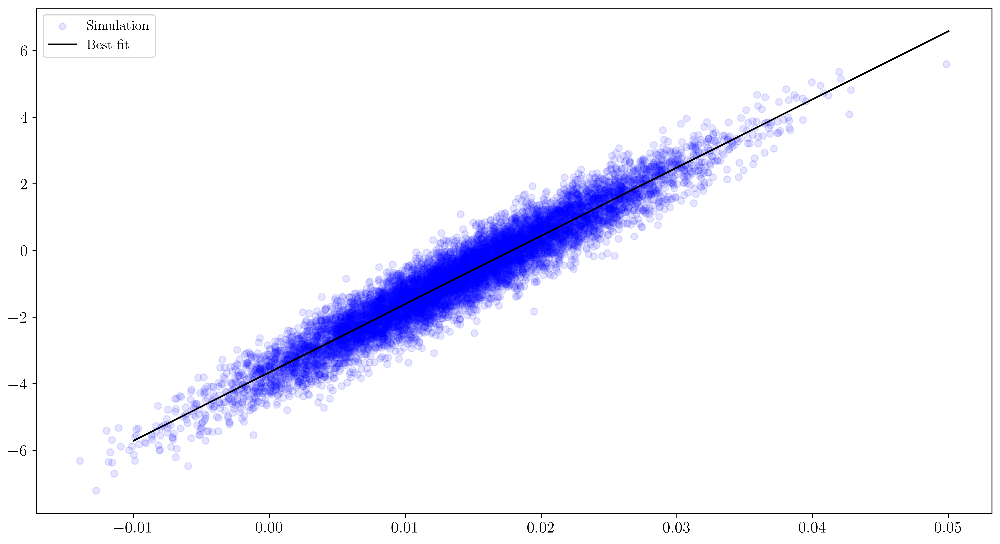

In [20]:
plt.figure()

plt.scatter(samples_sim_lq[:, 0], samples_sim_lq[:, 2], c='b', label='Simulation', alpha=0.1)
x = np.linspace(-0.01, 0.05)
a, b = get_degeneracy_direction(samples_sim_lq)
plt.plot(x, a*x + b, c='black', label='Best-fit')
plt.legend()
plt.show()

Removed no burn in


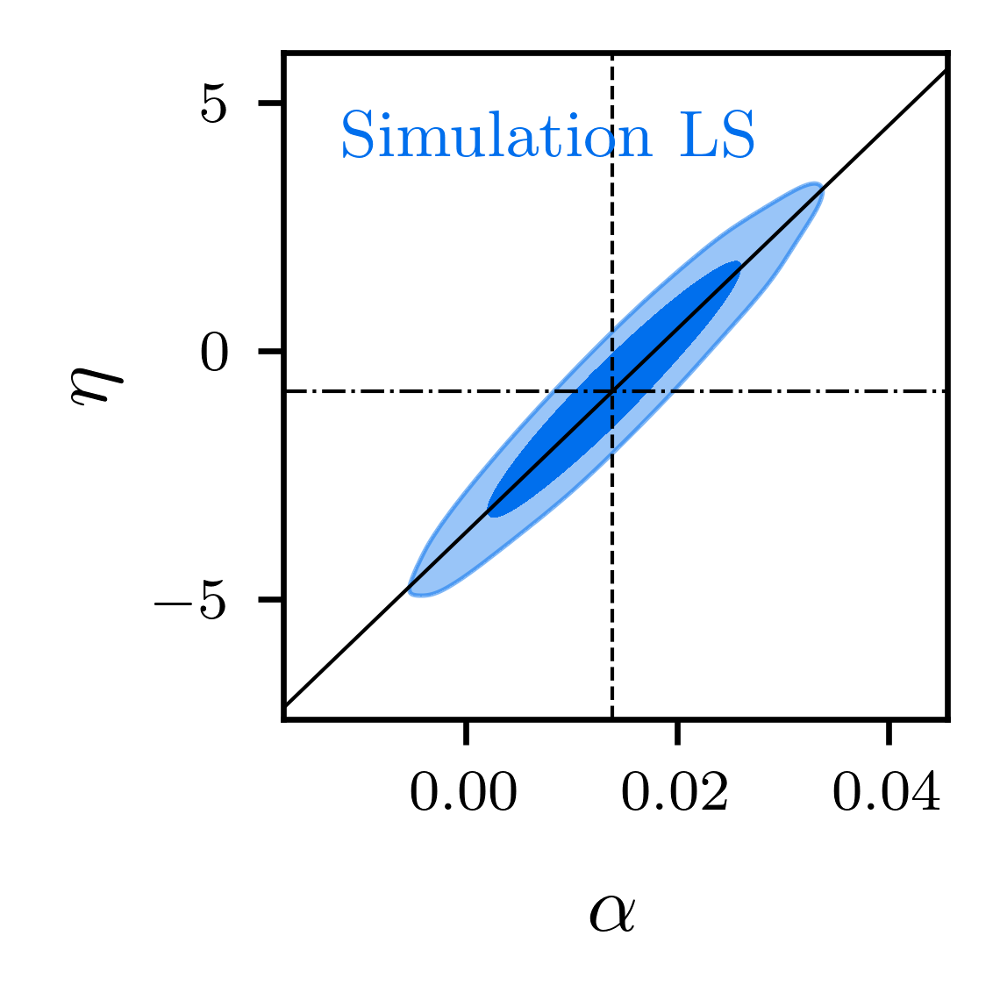

In [24]:
from matplotlib.gridspec import GridSpec
from PIL import Image

samples_sim_alpha_eta = MCSamples(samples=samples_sim_lq[:, (0, 2)], names=[r"\alpha", r"\eta"], labels=[r"\alpha", r"\eta"])

best_fit = np.percentile(samples_sim_lq, 50, axis=0)
# Filled 2D comparison plot with legend
fig = plt.figure(figsize=(15, 15))

gs = GridSpec(4, 3, figure=fig)

g = plots.get_subplot_plotter()
with tempfile.NamedTemporaryFile(suffix='.png') as temp_plot_file:
    g.plot_2d([samples_sim_alpha_eta], r'\alpha', r'\eta', filled=True)

    x = np.linspace(-0.05, 0.05)
    a, b = get_degeneracy_direction(samples_sim_lq)
    plt.plot(x, a*x + b, c='black', label='Best-fit', lw=0.5)

    g.add_x_marker(best_fit[0], color='black')
    g.add_y_marker(best_fit[2], color='black', ls='-.')
    g.add_legend(['Simulation LS'], colored_text=True);
    g.fig.savefig(temp_plot_file.name, dpi=600)
    temp_plot_file.seek(0)
    getdist_img = Image.open(temp_plot_file.name)

ax1 =  fig.add_subplot(gs[0:3, 0])
ax1.imshow(getdist_img)
ax1.axis('off')

ax2 = fig.add_subplot(gs[0, 1:])

eta_min = np.percentile(samples_sim_lq[:, 2], 5, axis=0)
eta_max = np.percentile(samples_sim_lq[:, 2], 95, axis=0)
range_eta = np.linspace(eta_min, eta_max, 10)

for eta in range_eta:
    xi_psf_sys = psf_fitter.compute_xi_psf_sys([best_fit[0], best_fit[1], eta])
    ax2.plot(theta, xi_psf_sys, label=r"$\eta = {:.3f}$".format(eta))

ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.set_ylabel(r'$\xi_{\rm PSF}$')
ax2.legend(fontsize = 10, loc='lower left')
ax2.text(0.7, 0.9, r'$\alpha = {:.3f}$, dashed line'.format(best_fit[0]), transform=ax2.transAxes, fontsize=10)

ax3 = fig.add_subplot(gs[1, 1:])

alpha_min = -0.01
alpha_max = 0.03
range_alpha = np.linspace(alpha_min, alpha_max, 10)

for alpha in range_alpha:
    xi_psf_sys = psf_fitter.compute_xi_psf_sys([alpha, best_fit[1], best_fit[2]])
    ax3.plot(theta, xi_psf_sys, label=r"$\alpha = {:.3f}$".format(alpha))

ax3.set_xscale('log')
ax3.set_yscale('log')
ax3.set_ylabel(r'$\xi_{\rm PSF}$')
ax3.legend(fontsize = 10, loc='lower left')
ax3.text(0.7, 0.9, r'$\eta = {:.3f}$, dotted-dashed line'.format(best_fit[2]), transform=ax3.transAxes, fontsize=10)

axs4 = fig.add_subplot(gs[2, 1:])

alpha_min = np.percentile(samples_sim_lq[:, 0], 5, axis=0)
alpha_max = np.percentile(samples_sim_lq[:, 0], 95, axis=0)
range_alpha = np.linspace(alpha_min, alpha_max, 10)

for alpha in range_alpha:
    eta = a*alpha+b
    xi_psf_sys = psf_fitter.compute_xi_psf_sys([alpha, best_fit[1], eta])
    axs4.plot(theta, xi_psf_sys, label=r"$\alpha = {:.3f}, \eta= {:.3f}$".format(alpha, eta))

axs4.set_xscale('log')
axs4.set_yscale('log')
axs4.set_ylabel(r'$\xi_{\rm PSF}$')
axs4.legend(fontsize = 10, loc='lower left')
axs4.text(0.7, 0.9, r'$(\alpha,\eta)$-degeneracy, solid line', transform=axs4.transAxes, fontsize=10)

ax5 = fig.add_subplot(gs[3, 1:])

beta_min = np.percentile(samples_sim_lq[:, 1], 5, axis=0)
beta_max = np.percentile(samples_sim_lq[:, 1], 95, axis=0)
range_beta = np.linspace(beta_min, beta_max, 10)

for beta in range_beta:
    xi_psf_sys = psf_fitter.compute_xi_psf_sys([best_fit[0], beta, best_fit[2]])
    ax5.plot(theta, xi_psf_sys, label=r"$\beta = {:.3f}$".format(beta))

ax5.set_xscale('log')
ax5.set_yscale('log')
ax5.set_ylabel(r'$\xi_{\rm PSF}$')
ax5.set_xlabel(r'$\theta$ (arcmin)')
ax5.legend(fontsize = 10, loc='upper right')

plt.show()

In [25]:
#Comparison with the samples obtained from MCMC.
nwalkers = 124
nsamples = 10000

npatches = [300, 150, None]
labels = ['Simulation', 'Jackknife', 'Theory']
path_samples = [
    base_dir+'/samples_sim_emcee_'+version+'.npy',
    base_dir+'/samples_jk_emcee_'+version+'.npy',
    base_dir+'/samples_th_emcee_'+version+'.npy'
]
run_mcmc = [False, False, False]

for label, npatch, path_sample, run in zip(labels, npatches, path_samples, run_mcmc):
    if label == 'Simulation':
        psf_fitter.load_covariance(path_cov_tau_sim, cov_type='tau')
    elif label == 'Jackknife':
        psf_fitter.load_covariance(path_cov_tau_jk, cov_type='tau')
    elif label == 'Theory':
        psf_fitter.load_covariance(path_cov_tau_th, cov_type='tau')
    if not os.path.exists(path_sample) or run:
        samples, _, _ = psf_fitter.run_chain(
            nwalkers=nwalkers,
            nsamples=nsamples,
            npatch=npatch,
            apply_debias=True if npatch is not None else False,
            savefig=None
        )
    else:
        samples = np.load(path_sample)
    if label=='Simulation':
        samples_sim_emcee = samples
    elif label=='Jackknife':
        samples_jk_emcee = samples
    elif label=='Theory':
        samples_th_emcee = samples

In [26]:
np.save(base_dir+'/samples_sim_emcee_'+version+'.npy', samples_sim_emcee)
np.save(base_dir+'/samples_jk_emcee_'+version+'.npy', samples_jk_emcee)
np.save(base_dir+'/samples_th_emcee_'+version+'.npy', samples_th_emcee)

Removed no burn in
Removed no burn in
Removed no burn in


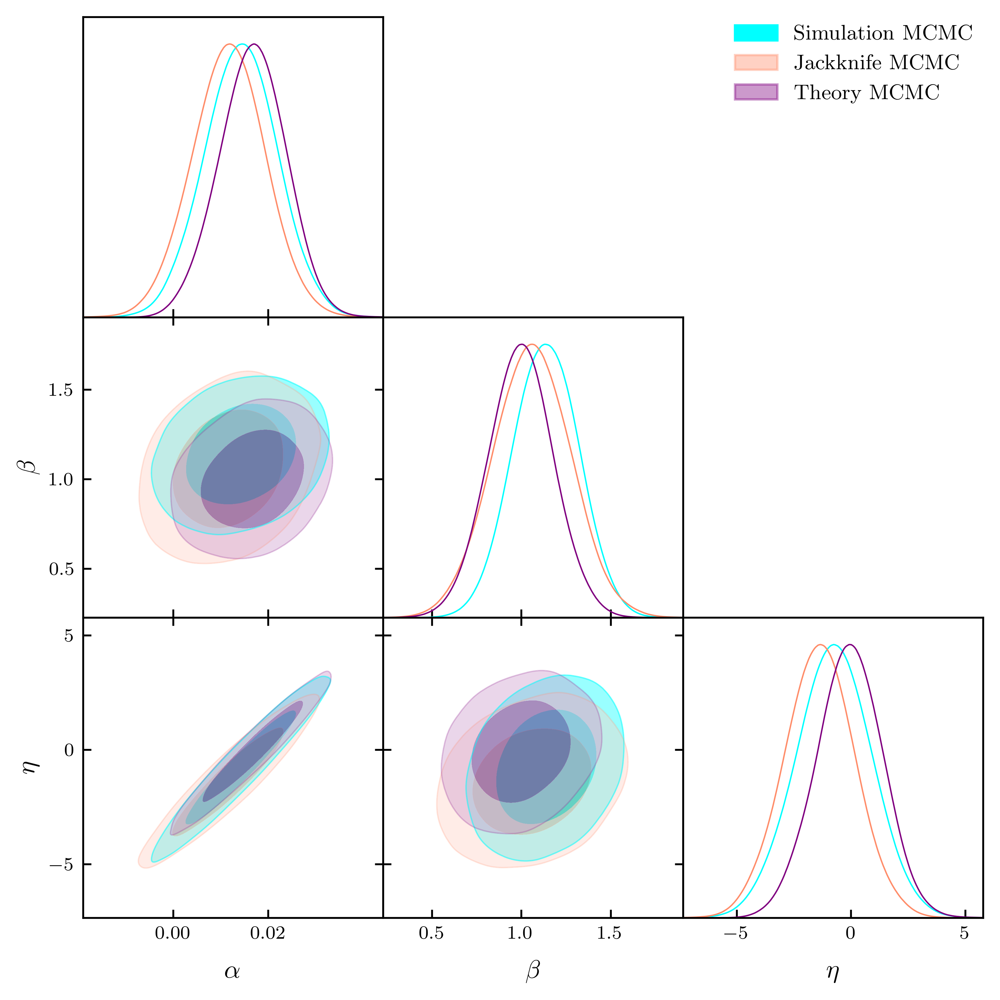

In [27]:
g = plots.get_subplot_plotter()

g.settings.figure_legend_frame = False
g.settings.alpha_filled_add=0.4

samples_sim_gd = MCSamples(samples=samples_sim_emcee, names=[r"\alpha", r"\beta", r"\eta"], labels=[r"\alpha", r"\beta", r"\eta"])
samples_jk_gd = MCSamples(samples=samples_jk_emcee, names=[r"\alpha", r"\beta", r"\eta"], labels=[r"\alpha", r"\beta", r"\eta"])
samples_th_gd = MCSamples(samples=samples_th_emcee, names=[r"\alpha", r"\beta", r"\eta"], labels=[r"\alpha", r"\beta", r"\eta"])

g.triangle_plot([samples_sim_gd, samples_jk_gd, samples_th_gd],
                filled=True,
                legend_labels=[r'Simulation MCMC', r'Jackknife MCMC', r'Theory MCMC'],
                legend_loc='upper right',
                line_args=[
                    {'color': 'cyan'},
                    {'color': '#ff8c69'},
                    {'color': 'purple'}
                ],
                contour_colors=['cyan', '#ff8c69', 'purple'])

plt.show()

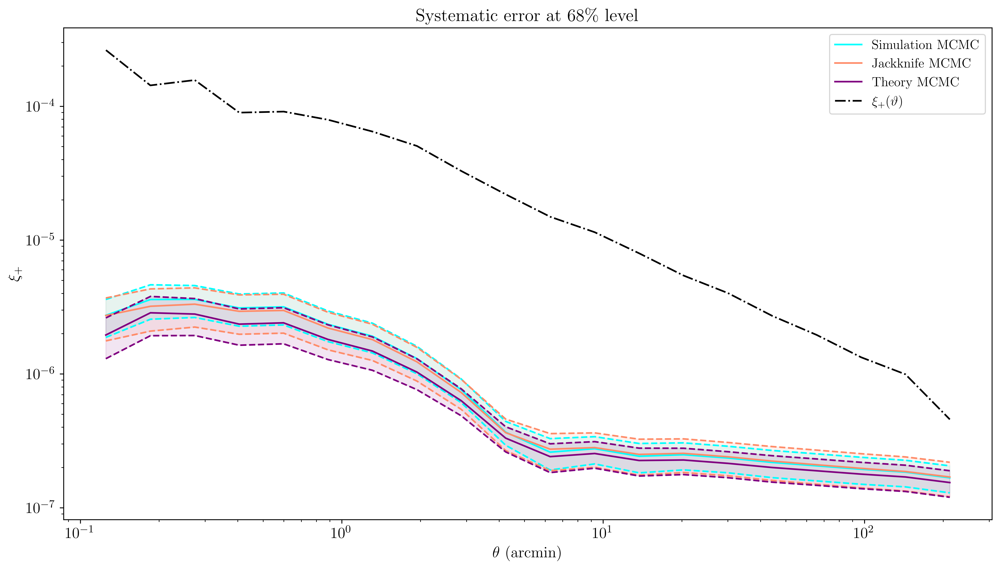

In [28]:
#plot of the xi_sys
plt.figure()

samples = [samples_sim_emcee, samples_jk_emcee, samples_th_emcee]
colors = ['cyan', '#ff8c69', 'purple']
labels = ['Simulation MCMC', 'Jackknife MCMC', 'Theory MCMC']

for sample, color, label in zip(samples, colors, labels):
    quant = 0.84
    quantiles = [1-quant, quant]
    nbins = psf_fitter.rho_stat_handler._treecorr_config['nbins']
    xi_psf_sys_samples = np.array([]).reshape(0, nbins)
    for i in range(len(sample)):
        xi_psf_sys = psf_fitter.compute_xi_psf_sys(sample[i])
        xi_psf_sys_samples = np.vstack((xi_psf_sys_samples, xi_psf_sys))
    
    xi_psf_sys_mean = np.mean(xi_psf_sys_samples, axis=0)
    xi_psf_sys_quant = np.quantile(xi_psf_sys_samples, quantiles, axis=0)
    theta = psf_fitter.rho_stat_handler.rho_stats['theta']
    plt.plot(theta, xi_psf_sys_mean, c=color, label=label)
    plt.plot(theta, xi_psf_sys_quant[0], c=color, ls='--')
    plt.plot(theta, xi_psf_sys_quant[1], c=color, ls='--')
    plt.fill_between(theta, xi_psf_sys_quant[0], xi_psf_sys_quant[1], color=color, alpha=0.1)

if os.path.exists(base_dir+'/xi_plus_'+version+'.fits'):
    xi_plus = fits.getdata(base_dir+'/xi_plus_'+version+'.fits')
    plt.plot(xi_plus['ANG'], xi_plus['VALUE'], c='k', ls='-.', label=r"$\xi_+(\vartheta)$")
else:
    raise ValueError("xi_plus file not found")

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\theta$ (arcmin)')
plt.ylabel(r'$\xi_{+}$')
plt.legend()
plt.title("Systematic error at 68\% level")

plt.show()

Removed no burn in
Removed no burn in


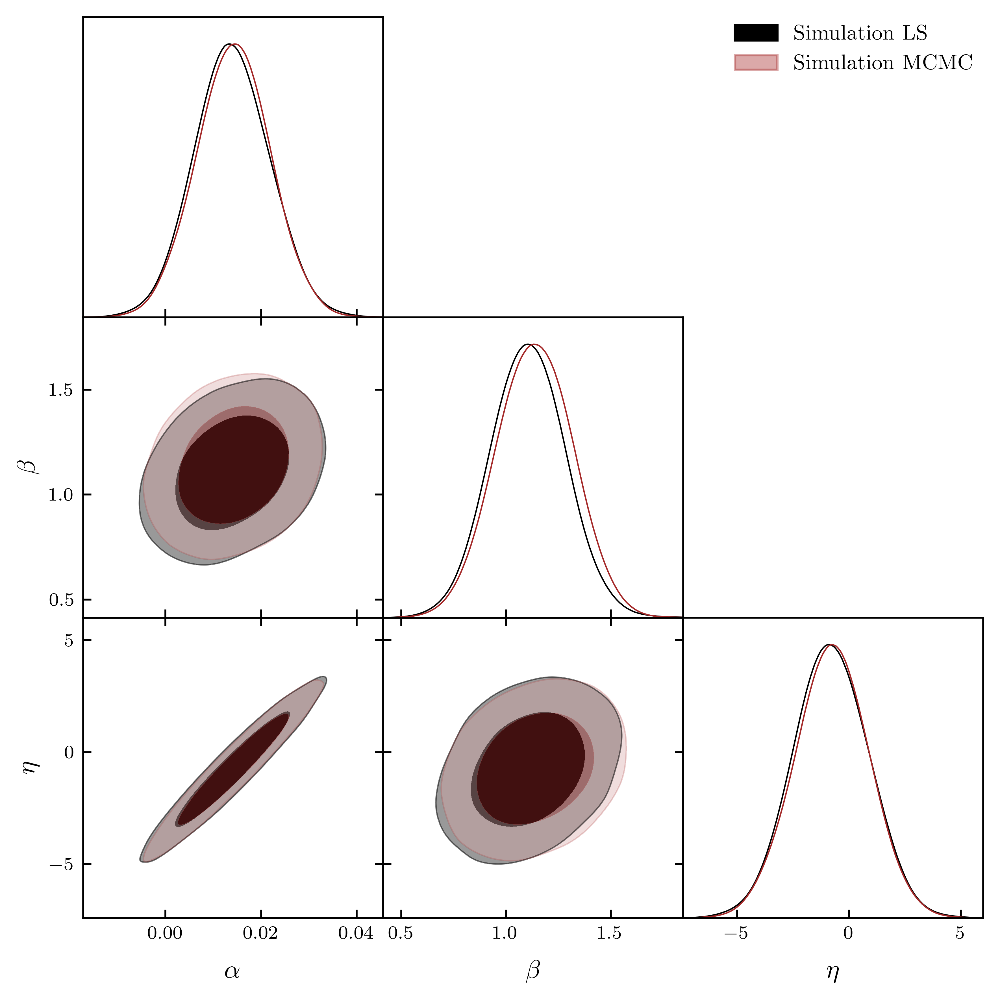

In [29]:
g = plots.get_subplot_plotter()

g.settings.figure_legend_frame = False
g.settings.alpha_filled_add=0.4

samples_lq_gd = MCSamples(samples=samples_sim_lq, names=[r"\alpha", r"\beta", r"\eta"], labels=[r"\alpha", r"\beta", r"\eta"])
samples_emcee_gd = MCSamples(samples=samples_sim_emcee, names=[r"\alpha", r"\beta", r"\eta"], labels=[r"\alpha", r"\beta", r"\eta"])

g.triangle_plot([samples_lq_gd, samples_emcee_gd],
                filled=True,
                legend_labels=[r'Simulation LS', r'Simulation MCMC'],
                legend_loc='upper right',
                line_args=[
                    {'color': 'black'},
                    {'color': 'brown'}
                ],
                contour_colors=['black', 'brown'])


plt.show()

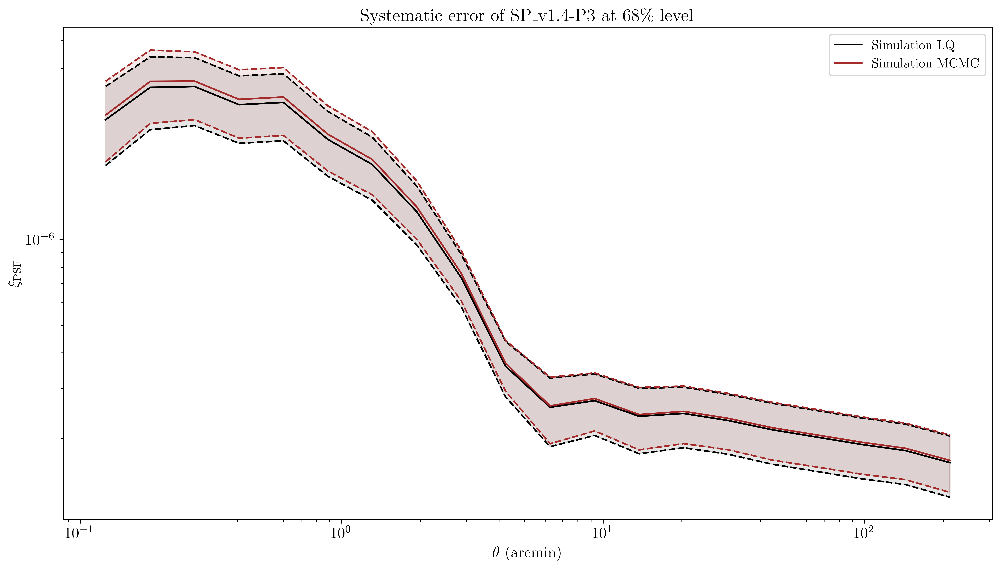

In [30]:
#plot of the xi_sys
plt.figure()

samples = [samples_sim_lq, samples_sim_emcee]
colors = ['black', 'brown']
labels = ['Simulation LQ', 'Simulation MCMC']

for sample, color, label in zip(samples, colors, labels):
    quant = 0.84
    quantiles = [1-quant, quant]
    nbins = psf_fitter.rho_stat_handler._treecorr_config['nbins']
    xi_psf_sys_samples = np.array([]).reshape(0, nbins)
    for i in range(len(sample)):
        xi_psf_sys = psf_fitter.compute_xi_psf_sys(sample[i])
        xi_psf_sys_samples = np.vstack((xi_psf_sys_samples, xi_psf_sys))
    
    xi_psf_sys_mean = np.mean(xi_psf_sys_samples, axis=0)
    xi_psf_sys_quant = np.quantile(xi_psf_sys_samples, quantiles, axis=0)
    theta = psf_fitter.rho_stat_handler.rho_stats['theta']
    plt.plot(theta, xi_psf_sys_mean, c=color, label=label)
    plt.plot(theta, xi_psf_sys_quant[0], c=color, ls='--')
    plt.plot(theta, xi_psf_sys_quant[1], c=color, ls='--')
    plt.fill_between(theta, xi_psf_sys_quant[0], xi_psf_sys_quant[1], color=color, alpha=0.1)

plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\theta$ (arcmin)')
plt.ylabel(r'$\xi_{\rm PSF}$')
plt.legend()
plt.title("Systematic error of SP_v1.4-P3 at 68\% level")

plt.show()

### Parameter values

In [31]:
from IPython.display import display, Math

percentiles = [16, 50, 84]
labels = [r"\alpha", r"\beta", r"\eta"]

def print_bound(samples, percentiles=percentiles):
    dim = samples.shape[1]
    for i in range(dim):
        mcmc = np.percentile(samples[:, i], q=percentiles)
        q = np.diff(mcmc)
        txt = "\mathrm{{{3}}} = {0:.3f}_{{-{1:.3f}}}^{{{2:.3f}}}"
        txt = txt.format(mcmc[1], q[0], q[1], labels[i])
        display(Math(txt))


print("Params simulation")
print("With Least-squares:")
print_bound(samples_sim_lq)
print("With MCMC:")
print_bound(samples_sim_emcee)

print("Params jackknife")
print("With Least-squares:")
print_bound(samples_jk_lq)
print("With MCMC:")
print_bound(samples_jk_emcee)

print("Params theory")
print("With Least-squares:")
print_bound(samples_th_lq)
print("With MCMC:")
print_bound(samples_th_emcee)

Params simulation
With Least-squares:


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

With MCMC:


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Params jackknife
With Least-squares:


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

With MCMC:


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Params theory
With Least-squares:


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

With MCMC:


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>